In [1]:
%cd '~/Documents/berkeley/SavageLab/scripts/tecantaloupe_distro/'

/Users/jackdesmarais/Documents/berkeley/SavageLab/scripts/tecantaloupe_distro


In [2]:
%matplotlib inline
import pandas as pd
import numpy as np
import seaborn
import itertools

from growth.plate_spec import PlateSpec
from growth.plate_time_course_parser import SavageLabM1000Excel
from matplotlib import pyplot as plt

In [7]:
plate = """2%GLU+0uMcopper+ADE	2%GLU+0uMcopper+ADE	2%GLU+0uMcopper+ADE	2%GLU+0uMcopper+ADE	2%GLU+0uMcopper+TRP	2%GLU+0uMcopper+TRP	2%GLU+0uMcopper+TRP	2%GLU+0uMcopper+TRP	2%GLU+0uMcopper+dCas9_ade	2%GLU+0uMcopper+dCas9_ade	2%GLU+0uMcopper+dCas9_ade	2%GLU+0uMcopper+dCas9_ade
2%GAL+0uMcopper+ADE	2%GAL+0uMcopper+ADE	2%GAL+0uMcopper+ADE	2%GAL+0uMcopper+ADE	2%GAL+0uMcopper+TRP	2%GAL+0uMcopper+TRP	2%GAL+0uMcopper+TRP	2%GAL+0uMcopper+TRP	2%GAL+0uMcopper+dCas9_ade	2%GAL+0uMcopper+dCas9_ade	2%GAL+0uMcopper+dCas9_ade	2%GAL+0uMcopper+dCas9_ade
4%GAL+0uMcopper+ADE	4%GAL+0uMcopper+ADE	4%GAL+0uMcopper+ADE	4%GAL+0uMcopper+ADE	4%GAL+0uMcopper+TRP	4%GAL+0uMcopper+TRP	4%GAL+0uMcopper+TRP	4%GAL+0uMcopper+TRP	4%GAL+0uMcopper+dCas9_ade	4%GAL+0uMcopper+dCas9_ade	4%GAL+0uMcopper+dCas9_ade	4%GAL+0uMcopper+dCas9_ade
2%GLU+100uMcopper+ADE	2%GLU+100uMcopper+ADE	2%GLU+100uMcopper+ADE	2%GLU+100uMcopper+ADE	2%GLU+100uMcopper+TRP	2%GLU+100uMcopper+TRP	2%GLU+100uMcopper+TRP	2%GLU+100uMcopper+TRP	2%GLU+100uMcopper+dCas9_ade	2%GLU+100uMcopper+dCas9_ade	2%GLU+100uMcopper+dCas9_ade	2%GLU+100uMcopper+dCas9_ade
2%GAL+100uMcopper+ADE	2%GAL+100uMcopper+ADE	2%GAL+100uMcopper+ADE	2%GAL+100uMcopper+ADE	2%GAL+100uMcopper+TRP	2%GAL+100uMcopper+TRP	2%GAL+100uMcopper+TRP	2%GAL+100uMcopper+TRP	2%GAL+100uMcopper+dCas9_ade	2%GAL+100uMcopper+dCas9_ade	2%GAL+100uMcopper+dCas9_ade	2%GAL+100uMcopper+dCas9_ade
4%GAL+100uMcopper+ADE	4%GAL+100uMcopper+ADE	4%GAL+100uMcopper+ADE	4%GAL+100uMcopper+ADE	4%GAL+100uMcopper+TRP	4%GAL+100uMcopper+TRP	4%GAL+100uMcopper+TRP	4%GAL+100uMcopper+TRP	4%GAL+100uMcopper+dCas9_ade	4%GAL+100uMcopper+dCas9_ade	4%GAL+100uMcopper+dCas9_ade	4%GAL+100uMcopper+dCas9_ade
											
											"""
plate = np.array([row.split('	') for row in plate.split('\n')])
print(plate.shape)

# grab index from old plate
ps = PlateSpec.FromFile('growth/plate_specs/2020_03_05_FolA_library_QC.csv')
display(ps.df)
plate = pd.DataFrame(plate, columns=ps.df.columns, index=['abcdefgh'.upper()[i] for i in range(8)])
display(plate)

psloc = 'growth/plate_specs/2021_03_18_gal_coper_promoter_test.csv'
plate.to_csv(psloc)

# PlateSpec defined in CSV for easy editing
ps = PlateSpec.FromFile(psloc)
name_mapping = ps.well_to_name_mapping()

# PlateSpec contains a DataFrame with the mapping. 
ps.df

(8, 12)


value_type                             name                                   \
column                                    1                                2   
A           Suppliments_1Cycle_Lon_1E6Lib 1  Suppliments_1Cycle_Lon_1E6Lib 2   
B           Suppliments_1Cycle_Lon_1E6Lib 1  Suppliments_1Cycle_Lon_1E6Lib 2   
C           Suppliments_3Cycle_Lon_1E5Lib 1  Suppliments_3Cycle_Lon_1E5Lib 2   
D           Suppliments_3Cycle_Lon_1E5Lib 1  Suppliments_3Cycle_Lon_1E5Lib 2   
E              thyA_sup_3Cycle_Lon_1E5Lib 1     thyA_sup_3Cycle_Lon_1E5Lib 2   
F              thyA_sup_3Cycle_Lon_1E5Lib 1     thyA_sup_3Cycle_Lon_1E5Lib 2   
G              thyA_sup_1Cycle_Lon_1E6Lib 1     thyA_sup_1Cycle_Lon_1E6Lib 2   
H              thyA_sup_1Cycle_Lon_1E6Lib 1     thyA_sup_1Cycle_Lon_1E6Lib 2   

value_type                                                                    \
column                                    3                                4   
A           Suppliments_1Cycle_Lon_1E6Lib 3  Suppliments_1Cycle_Lon_1E6Lib 4   
B           Suppliments_1Cycle_Lon_1E6Lib 3  Suppliments_1Cycle_Lon_1E6Lib 4   
C           Suppliments_3Cycle_Lon_1E5Lib 3  Suppliments_3Cycle_Lon_1E5Lib 4   
D           Suppliments_3Cycle_Lon_1E5Lib 3  Suppliments_3Cycle_Lon_1E5Lib 4   
E              thyA_sup_3Cycle_Lon_1E5Lib 3     thyA_sup_3Cycle_Lon_1E5Lib 4   
F              thyA_sup_3Cycle_Lon_1E5Lib 3     thyA_sup_3Cycle_Lon_1E5Lib 4   
G              thyA_sup_1Cycle_Lon_1E6Lib 3     thyA_sup_1Cycle_Lon_1E6Lib 4   
H              thyA_sup_1Cycle_Lon_1E6Lib 3     thyA_sup_1Cycle_Lon_1E6Lib 4   

value_type                                                                    \
column                                    5                                6   
A           Suppliments_1Cycle_Lon_1E6Lib 5  Suppliments_1Cycle_Lon_1E6Lib 6   
B           Suppliments_1Cycle_Lon_1E6Lib 5  Suppliments_1Cycle_Lon_1E6Lib 6   
C           Suppliments_3Cycle_Lon_1E5Lib 5  Suppliments_3Cycle_Lon_1E5Lib 6   
D           Suppliments_3Cycle_Lon_1E5Lib 5  Suppliments_3Cycle_Lon_1E5Lib 6   
E              thyA_sup_3Cycle_Lon_1E5Lib 5     thyA_sup_3Cycle_Lon_1E5Lib 6   
F              thyA_sup_3Cycle_Lon_1E5Lib 5     thyA_sup_3Cycle_Lon_1E5Lib 6   
G              thyA_sup_1Cycle_Lon_1E6Lib 5     thyA_sup_1Cycle_Lon_1E6Lib 6   
H              thyA_sup_1Cycle_Lon_1E6Lib 5     thyA_sup_1Cycle_Lon_1E6Lib 6   

value_type                                                                    \
column                                    7                                8   
A           Suppliments_1Cycle_Lon_1E6Lib 7  Suppliments_1Cycle_Lon_1E6Lib 8   
B           Suppliments_1Cycle_Lon_1E6Lib 7  Suppliments_1Cycle_Lon_1E6Lib 8   
C           Suppliments_3Cycle_Lon_1E5Lib 7  Suppliments_3Cycle_Lon_1E5Lib 8   
D           Suppliments_3Cycle_Lon_1E5Lib 7  Suppliments_3Cycle_Lon_1E5Lib 8   
E              thyA_sup_3Cycle_Lon_1E5Lib 7     thyA_sup_3Cycle_Lon_1E5Lib 8   
F              thyA_sup_3Cycle_Lon_1E5Lib 7     thyA_sup_3Cycle_Lon_1E5Lib 8   
G              thyA_sup_1Cycle_Lon_1E6Lib 7     thyA_sup_1Cycle_Lon_1E6Lib 8   
H              thyA_sup_1Cycle_Lon_1E6Lib 7     thyA_sup_1Cycle_Lon_1E6Lib 8   

value_type                                                                     \
column                                    9                                10   
A           Suppliments_1Cycle_Lon_1E6Lib 9  Suppliments_1Cycle_Lon_1E6Lib_10   
B           Suppliments_1Cycle_Lon_1E6Lib 9  Suppliments_1Cycle_Lon_1E6Lib_10   
C           Suppliments_3Cycle_Lon_1E5Lib 9  Suppliments_3Cycle_Lon_1E5Lib_10   
D           Suppliments_3Cycle_Lon_1E5Lib 9  Suppliments_3Cycle_Lon_1E5Lib_10   
E              thyA_sup_3Cycle_Lon_1E5Lib 9     thyA_sup_3Cycle_Lon_1E5Lib_10   
F              thyA_sup_3Cycle_Lon_1E5Lib 9     thyA_sup_3Cycle_Lon_1E5Lib_10   
G              thyA_sup_1Cycle_Lon_1E6Lib 9     thyA_sup_1Cycle_Lon_1E6Lib_10   
H              thyA_sup_1Cycle_Lon_1E6Lib 9     thyA_sup_1Cycle_Lon

value_type                   name                         \
column                          1                      2   
A             2%GLU+0uMcopper+ADE    2%GLU+0uMcopper+ADE   
B             2%GAL+0uMcopper+ADE    2%GAL+0uMcopper+ADE   
C             4%GAL+0uMcopper+ADE    4%GAL+0uMcopper+ADE   
D           2%GLU+100uMcopper+ADE  2%GLU+100uMcopper+ADE   
E           2%GAL+100uMcopper+ADE  2%GAL+100uMcopper+ADE   
F           4%GAL+100uMcopper+ADE  4%GAL+100uMcopper+ADE   
G                                                          
H                                                          

value_type                                                \
column                          3                      4   
A             2%GLU+0uMcopper+ADE    2%GLU+0uMcopper+ADE   
B             2%GAL+0uMcopper+ADE    2%GAL+0uMcopper+ADE   
C             4%GAL+0uMcopper+ADE    4%GAL+0uMcopper+ADE   
D           2%GLU+100uMcopper+ADE  2%GLU+100uMcopper+ADE   
E           2%GAL+100uMcopper+ADE  2%GAL+100uMcopper+ADE   
F           4%GAL+100uMcopper+ADE  4%GAL+100uMcopper+ADE   
G                                                          
H                                                          

value_type                                                \
column                          5                      6   
A             2%GLU+0uMcopper+TRP    2%GLU+0uMcopper+TRP   
B             2%GAL+0uMcopper+TRP    2%GAL+0uMcopper+TRP   
C             4%GAL+0uMcopper+TRP    4%GAL+0uMcopper+TRP   
D           2%GLU+100uMcopper+TRP  2%GLU+100uMcopper+TRP   
E           2%GAL+100uMcopper+TRP  2%GAL+100uMcopper+TRP   
F           4%GAL+100uMcopper+TRP  4%GAL+100uMcopper+TRP   
G                                                          
H                                                          

value_type                                                \
column                          7                      8   
A             2%GLU+0uMcopper+TRP    2%GLU+0uMcopper+TRP   
B             2%GAL+0uMcopper+TRP    2%GAL+0uMcopper+TRP   
C             4%GAL+0uMcopper+TRP    4%GAL+0uMcopper+TRP   
D           2%GLU+100uMcopper+TRP  2%GLU+100uMcopper+TRP   
E           2%GAL+100uMcopper+TRP  2%GAL+100uMcopper+TRP   
F           4%GAL+100uMcopper+TRP  4%GAL+100uMcopper+TRP   
G                                                          
H                                                          

value_type                                                            \
column                                9                           10   
A             2%GLU+0uMcopper+dCas9_ade    2%GLU+0uMcopper+dCas9_ade   
B             2%GAL+0uMcopper+dCas9_ade    2%GAL+0uMcopper+dCas9_ade   
C             4%GAL+0uMcopper+dCas9_ade    4%GAL+0uMcopper+dCas9_ade   
D           2%GLU+100uMcopper+dCas9_ade  2%GLU+100uMcopper+dCas9_ade   
E           2%GAL+100uMcopper+dCas9_ade  2%GAL+100uMcopper+dCas9_ade   
F           4%GAL+100uMcopper+dCas9_ade  4%GAL+100uMcopper+dCas9_ade   
G                                                                      
H                                                                      

value_type                                                            
column                               11                           12  
A             2%GLU+0uMcopper+dCas9_ade    2%GLU+0uMcopper+dCas9_ade  
B             2%GAL+0uMcopper+dCas9_ade    2%GAL+0uMcopper+dCas9_ade  
C             4%GAL+0uMcopper+dCas9_ade    4%GAL+0uMcopper+dCas9_ade  
D           2%GLU+100uMcopper+dCas9_ade  2%GLU+100uMcopper+dCas9_ade  
E           2%GAL+100uMcopper+dCas9_ade  2%GAL+100uMcopper+dCas9_ade  
F           4%GAL+100uMcopper+dCas9_ade  4%GAL+100uMcopper+dCas9_ade  
G                                                                     
H

value_type                   name                         \
column                          1                      2   
A             2%GLU+0uMcopper+ADE    2%GLU+0uMcopper+ADE   
B             2%GAL+0uMcopper+ADE    2%GAL+0uMcopper+ADE   
C             4%GAL+0uMcopper+ADE    4%GAL+0uMcopper+ADE   
D           2%GLU+100uMcopper+ADE  2%GLU+100uMcopper+ADE   
E           2%GAL+100uMcopper+ADE  2%GAL+100uMcopper+ADE   
F           4%GAL+100uMcopper+ADE  4%GAL+100uMcopper+ADE   
G                             NaN                    NaN   
H                             NaN                    NaN   

value_type                                                \
column                          3                      4   
A             2%GLU+0uMcopper+ADE    2%GLU+0uMcopper+ADE   
B             2%GAL+0uMcopper+ADE    2%GAL+0uMcopper+ADE   
C             4%GAL+0uMcopper+ADE    4%GAL+0uMcopper+ADE   
D           2%GLU+100uMcopper+ADE  2%GLU+100uMcopper+ADE   
E           2%GAL+100uMcopper+ADE  2%GAL+100uMcopper+ADE   
F           4%GAL+100uMcopper+ADE  4%GAL+100uMcopper+ADE   
G                             NaN                    NaN   
H                             NaN                    NaN   

value_type                                                \
column                          5                      6   
A             2%GLU+0uMcopper+TRP    2%GLU+0uMcopper+TRP   
B             2%GAL+0uMcopper+TRP    2%GAL+0uMcopper+TRP   
C             4%GAL+0uMcopper+TRP    4%GAL+0uMcopper+TRP   
D           2%GLU+100uMcopper+TRP  2%GLU+100uMcopper+TRP   
E           2%GAL+100uMcopper+TRP  2%GAL+100uMcopper+TRP   
F           4%GAL+100uMcopper+TRP  4%GAL+100uMcopper+TRP   
G                             NaN                    NaN   
H                             NaN                    NaN   

value_type                                                \
column                          7                      8   
A             2%GLU+0uMcopper+TRP    2%GLU+0uMcopper+TRP   
B             2%GAL+0uMcopper+TRP    2%GAL+0uMcopper+TRP   
C             4%GAL+0uMcopper+TRP    4%GAL+0uMcopper+TRP   
D           2%GLU+100uMcopper+TRP  2%GLU+100uMcopper+TRP   
E           2%GAL+100uMcopper+TRP  2%GAL+100uMcopper+TRP   
F           4%GAL+100uMcopper+TRP  4%GAL+100uMcopper+TRP   
G                             NaN                    NaN   
H                             NaN                    NaN   

value_type                                                            \
column                                9                           10   
A             2%GLU+0uMcopper+dCas9_ade    2%GLU+0uMcopper+dCas9_ade   
B             2%GAL+0uMcopper+dCas9_ade    2%GAL+0uMcopper+dCas9_ade   
C             4%GAL+0uMcopper+dCas9_ade    4%GAL+0uMcopper+dCas9_ade   
D           2%GLU+100uMcopper+dCas9_ade  2%GLU+100uMcopper+dCas9_ade   
E           2%GAL+100uMcopper+dCas9_ade  2%GAL+100uMcopper+dCas9_ade   
F           4%GAL+100uMcopper+dCas9_ade  4%GAL+100uMcopper+dCas9_ade   
G                                   NaN                          NaN   
H                                   NaN                          NaN   

value_type                                                            
column                               11                           12  
A             2%GLU+0uMcopper+dCas9_ade    2%GLU+0uMcopper+dCas9_ade  
B             2%GAL+0uMcopper+dCas9_ade    2%GAL+0uMcopper+dCas9_ade  
C             4%GAL+0uMcopper+dCas9_ade    4%GAL+0uMcopper+dCas9_ade  
D           2%GLU+100uMcopper+dCas9_ade  2%GLU+100uMcopper+dCas9_ade  
E           2%GAL+100uMcopper+dCas9_ade  2%GAL+100uMcopper+dCas9_ade  
F           4%GAL+100uMcopper+dCas9_ade  4%GAL+100uMcopper+dCas9_ade  
G                                   NaN                          NaN  
H                                   NaN                          NaN

In [5]:
parser = SavageLabM1000Excel()
timecourse = parser.ParseFromFilename('growth/data/2021_03_18_gal_cop_promotertest.xlsx')

blanked = timecourse.blank()
# You can blank each well against it's own early timepoints
# by not setting blank_wells

# Smooth with default params.
smoothed = blanked.smooth()

['abs600', 'mCherry', 'sfGFP', 'sfGFP2']


<Figure size 720x720 with 0 Axes>

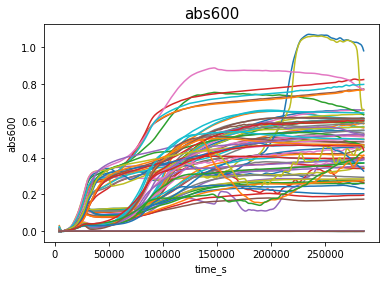

<Figure size 720x720 with 0 Axes>

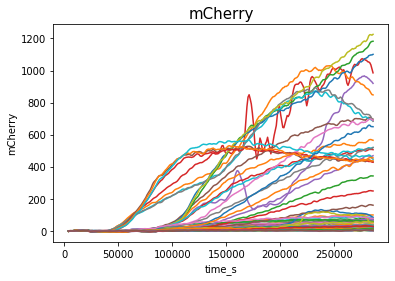

<Figure size 720x720 with 0 Axes>

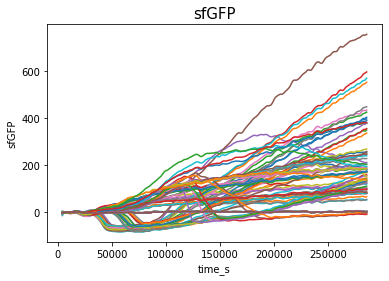

<Figure size 720x720 with 0 Axes>

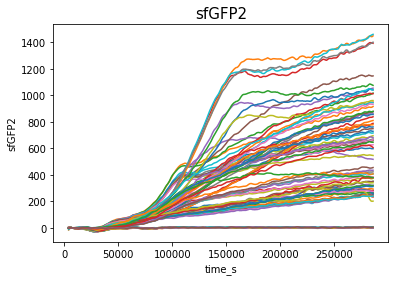

In [6]:
# Smoothed & blanked data.
print(timecourse.labels())
for label in timecourse.labels():
    fig = plt.figure(figsize=(10,10))
    OD_data = smoothed.data_for_label(label)
    OD_data.plot(x='time_s', legend=False)
    plt.ylabel(label)
    plt.title(label, fontsize=15)
    plt.show()


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


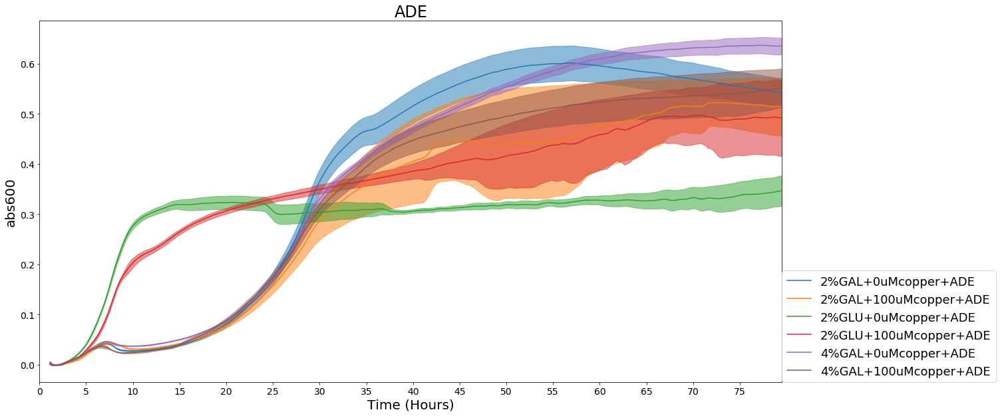

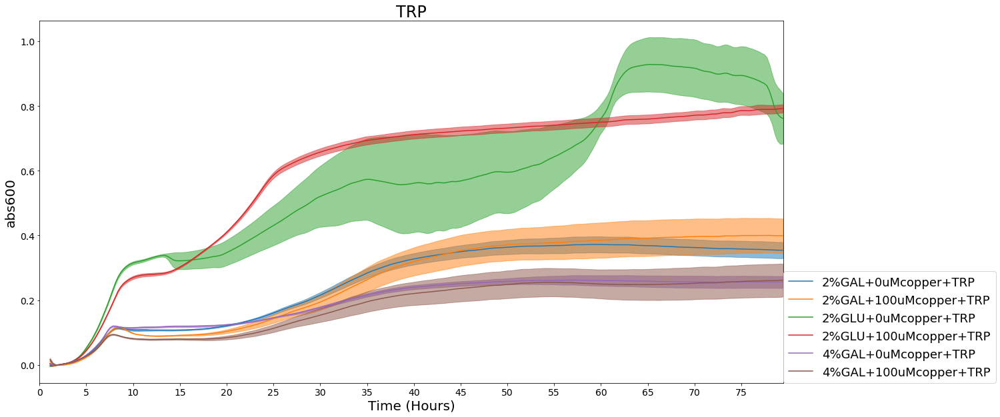

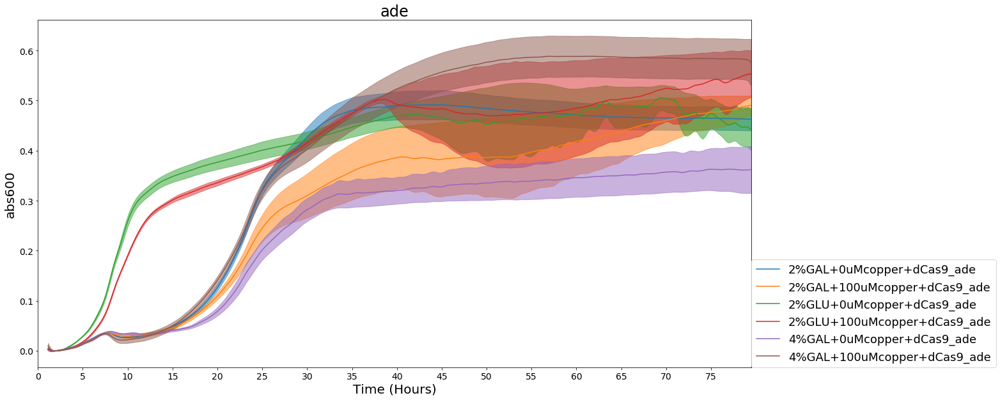

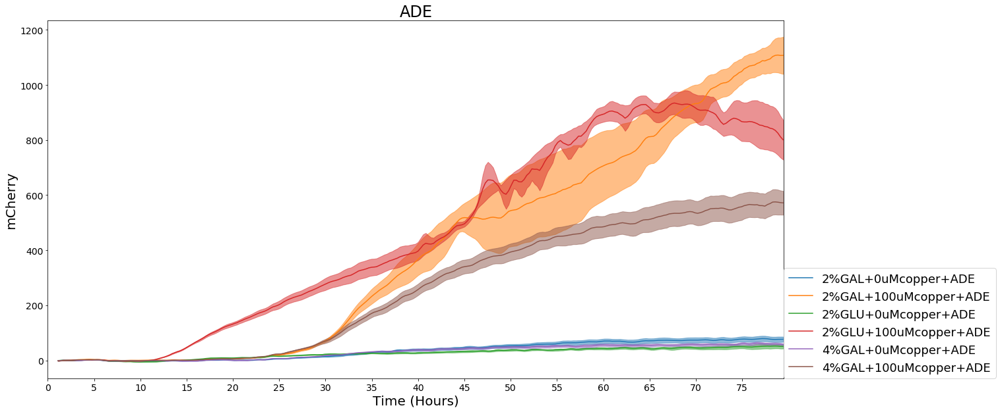

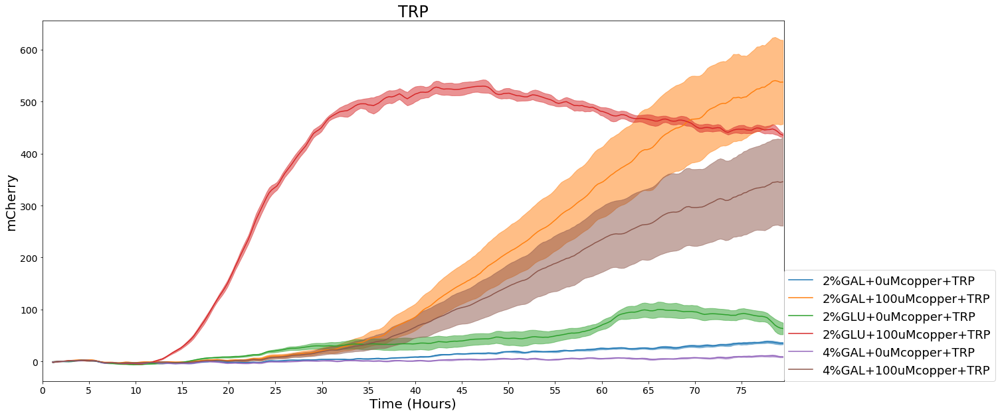

...

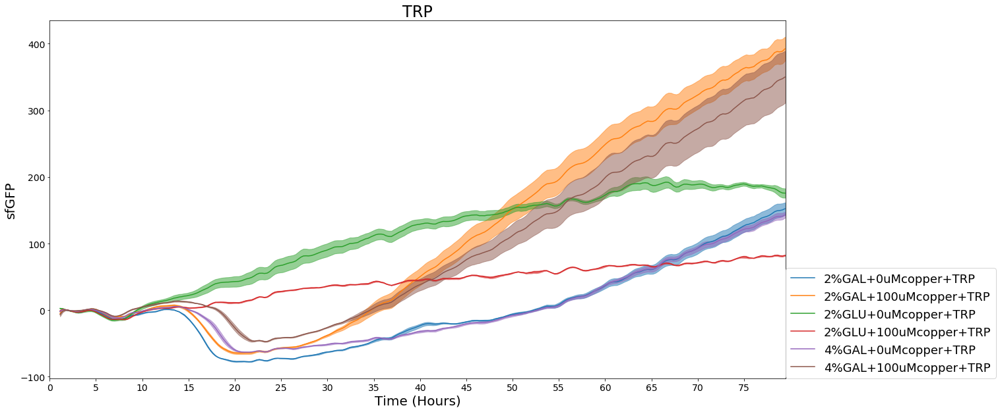

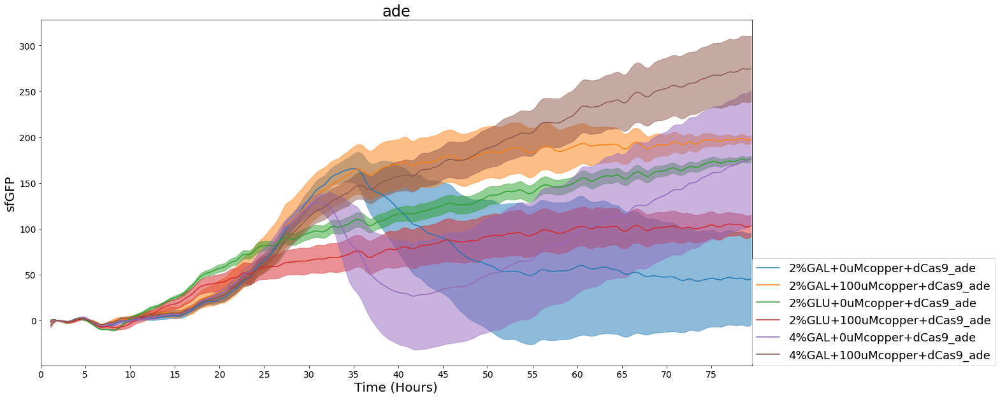

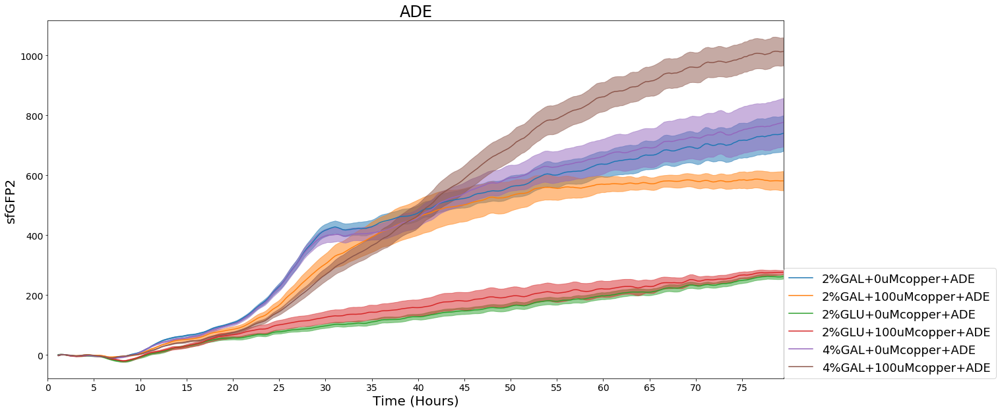

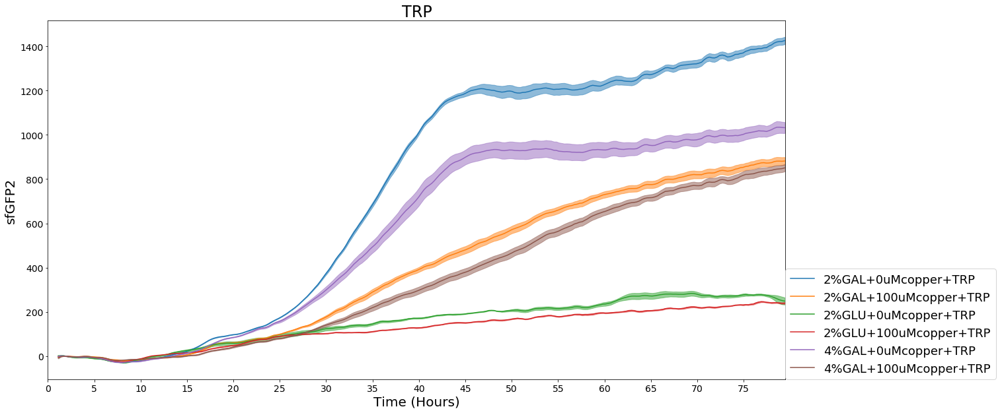

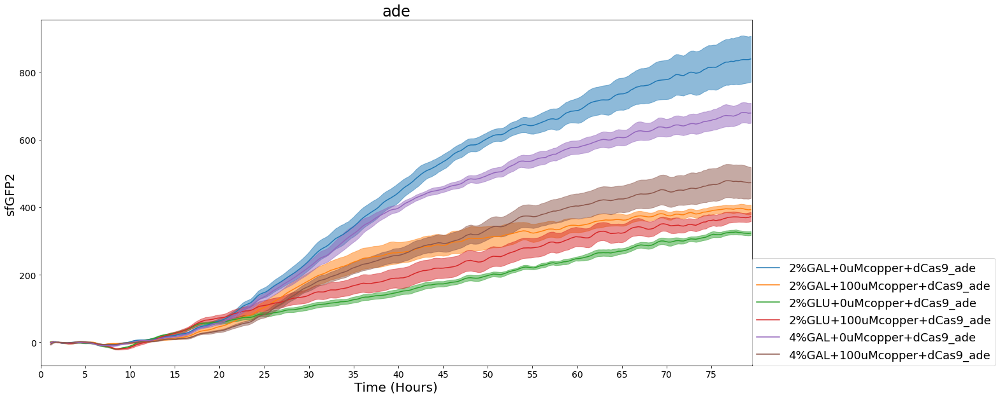

In [8]:
# figure outr what;s going on with means

means = smoothed.mean_by_name(ps)
sems = smoothed.sem_by_name(ps)

for measure in timecourse.labels():
    mean_OD = means.data_for_label(measure)
    sems_OD = sems.data_for_label(measure)

    # groupings of samples for plotting
    samples = ['ADE','TRP','ade']

    for sample in samples:
        plt.figure(figsize=(20,10))
        time_h = mean_OD.time_s / (60.0*60.0)

        colors = seaborn.color_palette()
        for i, c in enumerate([c for c in mean_OD.columns if (c.endswith(sample))]):
            label = c
            color = colors[i % len(colors)]
            plt.fill_between(time_h, mean_OD[c] - sems_OD[c], mean_OD[c] + sems_OD[c],
                             color=color, alpha=0.5)
            plt.plot(time_h, mean_OD[c], label=label, color=color)


        plt.legend(loc=(1,0), fontsize=18)
        plt.xlim(0, np.max(time_h)+.1)
    #     plt.ylim(-0.1, 1.3)
        plt.xticks(np.arange(0, np.max(time_h)+.1, 5), fontsize=14)
        plt.yticks(fontsize=14)
        plt.title(sample, fontsize=24)
        plt.xlabel('Time (Hours)', fontsize=20)
        plt.ylabel(measure, fontsize=20)

    plt.show()

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


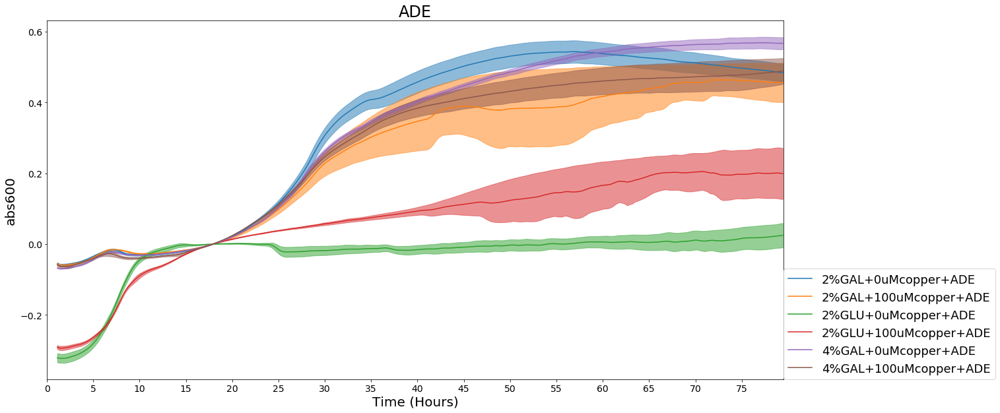

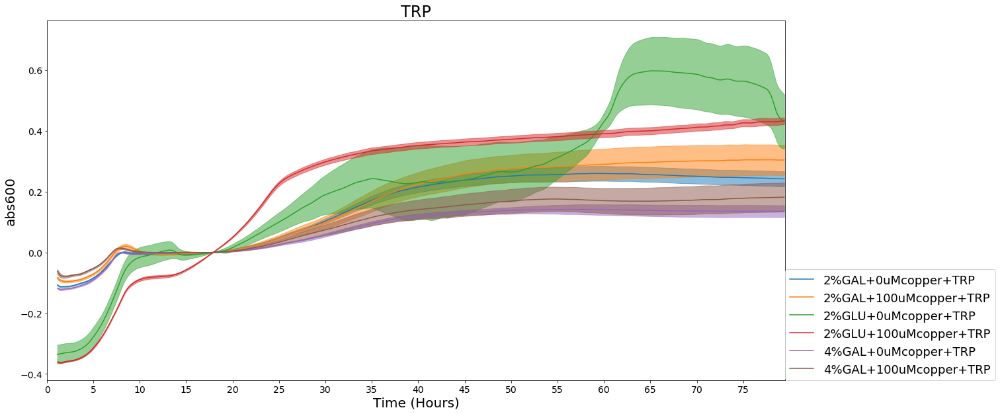

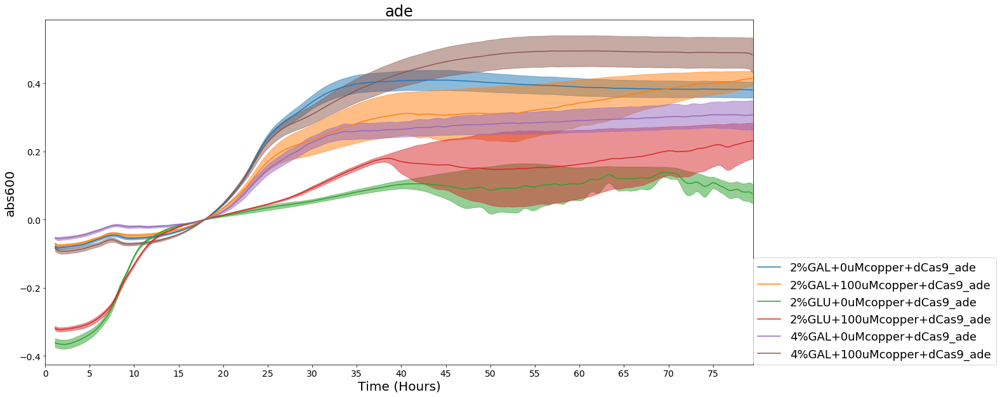

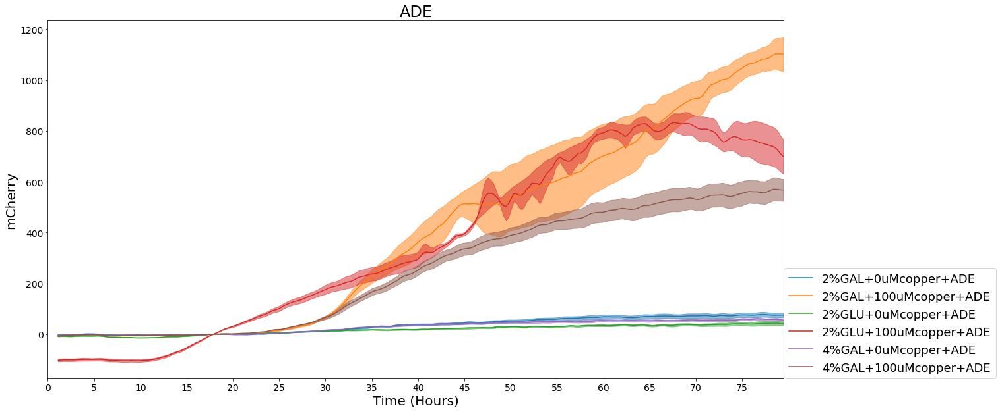

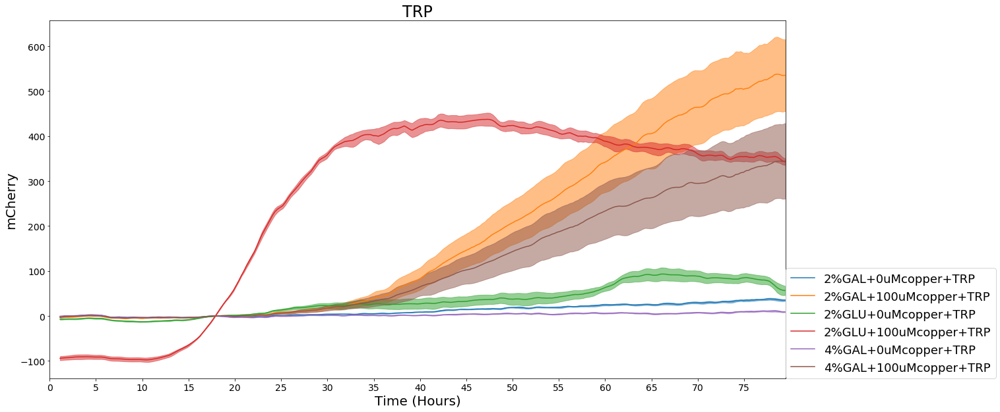

...

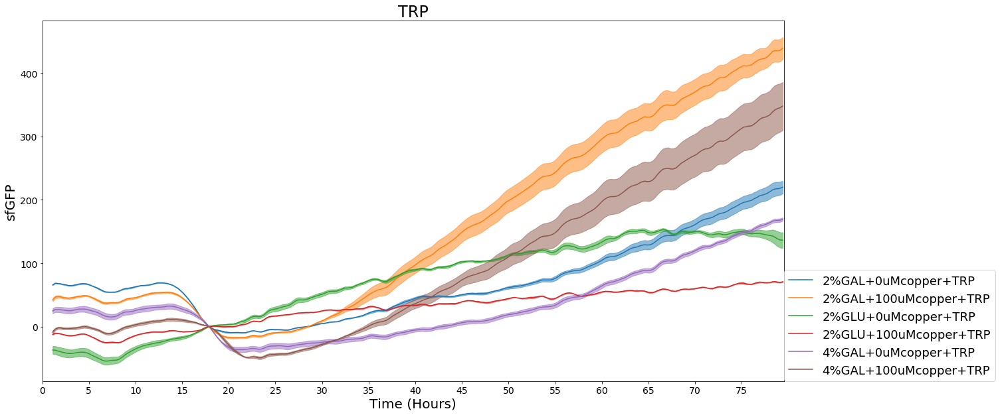

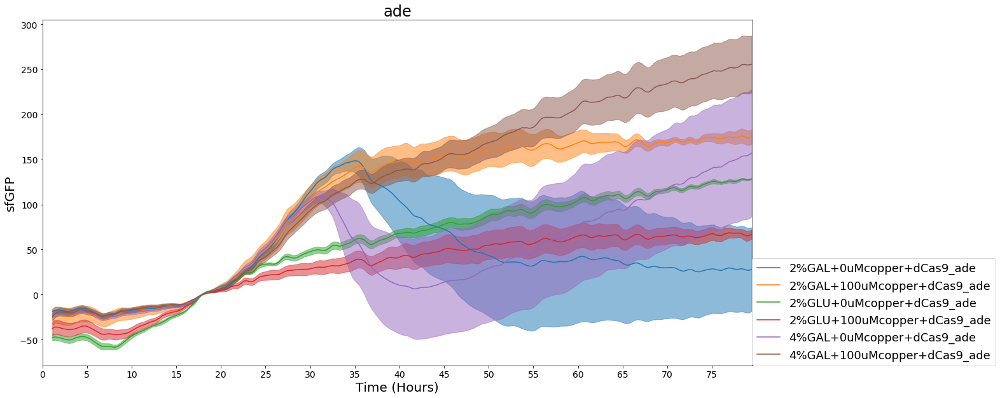

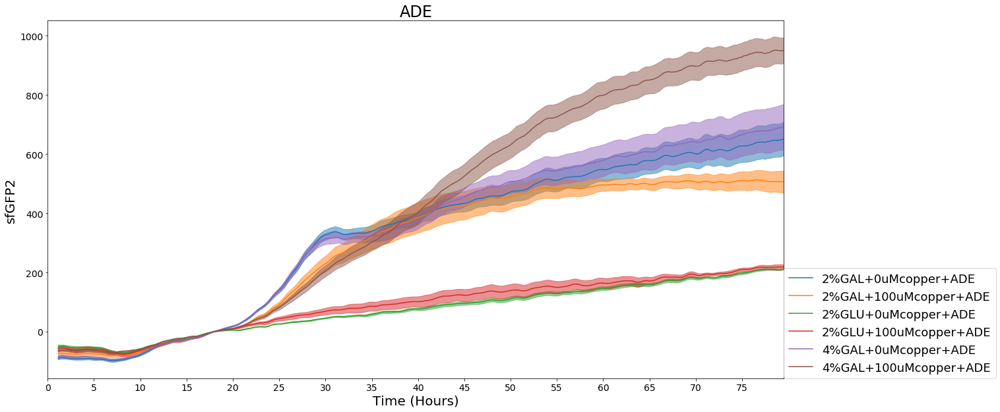

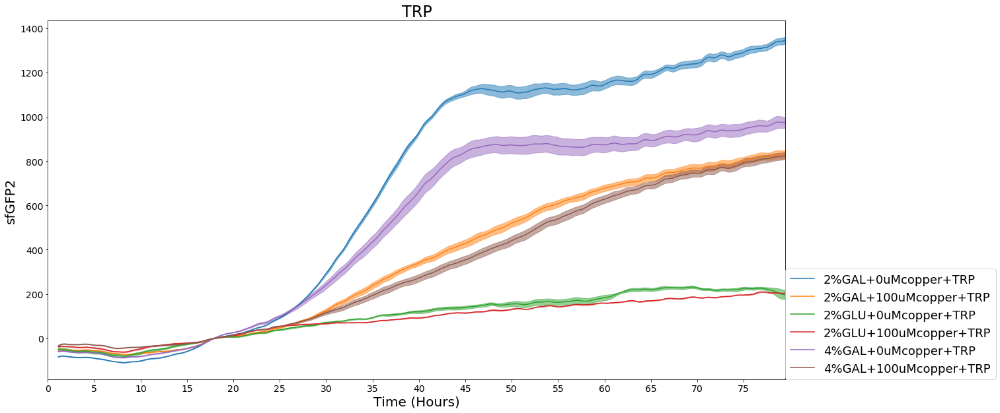

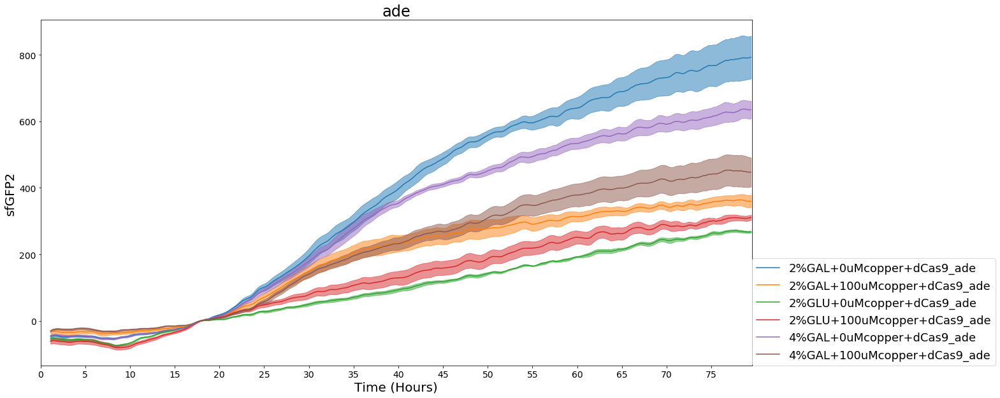

In [10]:
blanked = timecourse.blank(n_skip=60)
smoothed = blanked.smooth()

# figure outr what;s going on with means

means = smoothed.mean_by_name(ps)
sems = smoothed.sem_by_name(ps)

for measure in timecourse.labels():
    mean_OD = means.data_for_label(measure)
    sems_OD = sems.data_for_label(measure)

    # groupings of samples for plotting
    samples = ['ADE','TRP','ade']

    for sample in samples:
        plt.figure(figsize=(20,10))
        time_h = mean_OD.time_s / (60.0*60.0)

        colors = seaborn.color_palette()
        for i, c in enumerate([c for c in mean_OD.columns if (c.endswith(sample))]):
            label = c
            color = colors[i % len(colors)]
            plt.fill_between(time_h, mean_OD[c] - sems_OD[c], mean_OD[c] + sems_OD[c],
                             color=color, alpha=0.5)
            plt.plot(time_h, mean_OD[c], label=label, color=color)


        plt.legend(loc=(1,0), fontsize=18)
        plt.xlim(0, np.max(time_h)+.1)
    #     plt.ylim(-0.1, 1.3)
        plt.xticks(np.arange(0, np.max(time_h)+.1, 5), fontsize=14)
        plt.yticks(fontsize=14)
        plt.title(sample, fontsize=24)
        plt.xlabel('Time (Hours)', fontsize=20)
        plt.ylabel(measure, fontsize=20)

    plt.show()

In [45]:
red_per_od = smoothed.ratio_time_course('mCherry','abs600')

means = red_per_od.mean_by_name(ps).smoothed()
sems = red_per_od.sem_by_name(ps)

means.labels()

['mCherry/abs600']

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


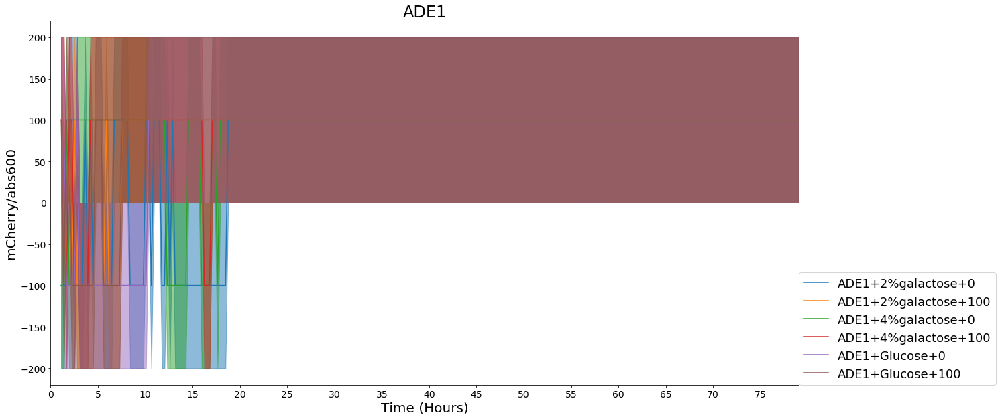

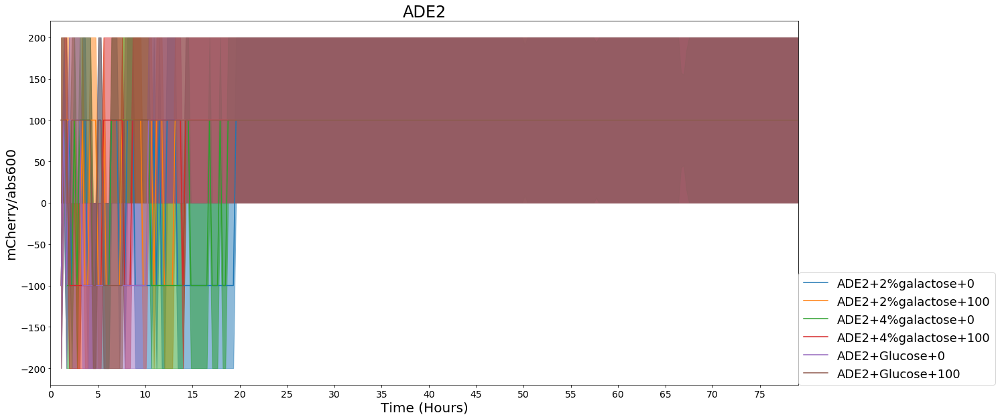

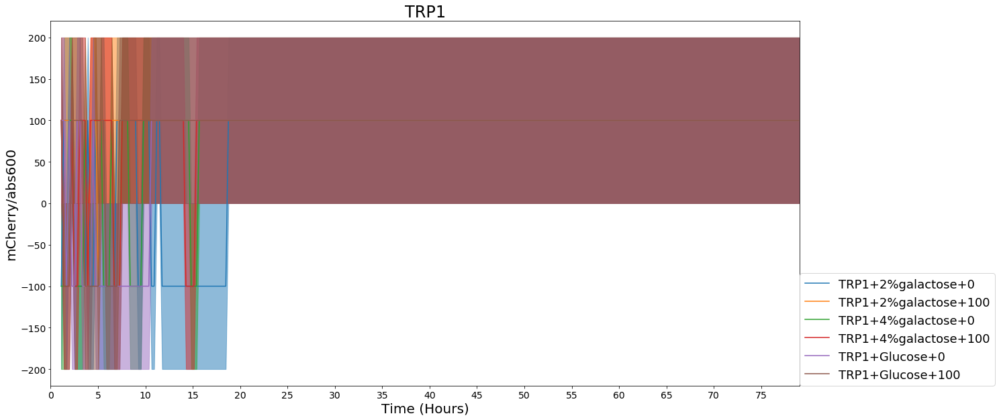

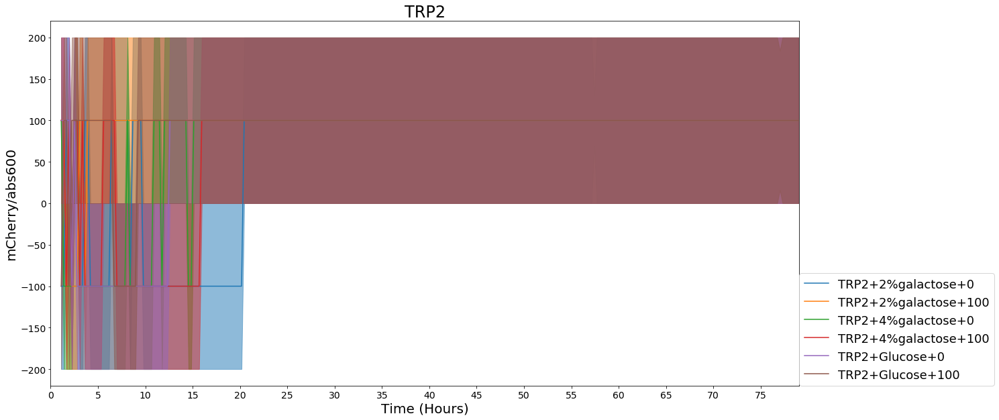

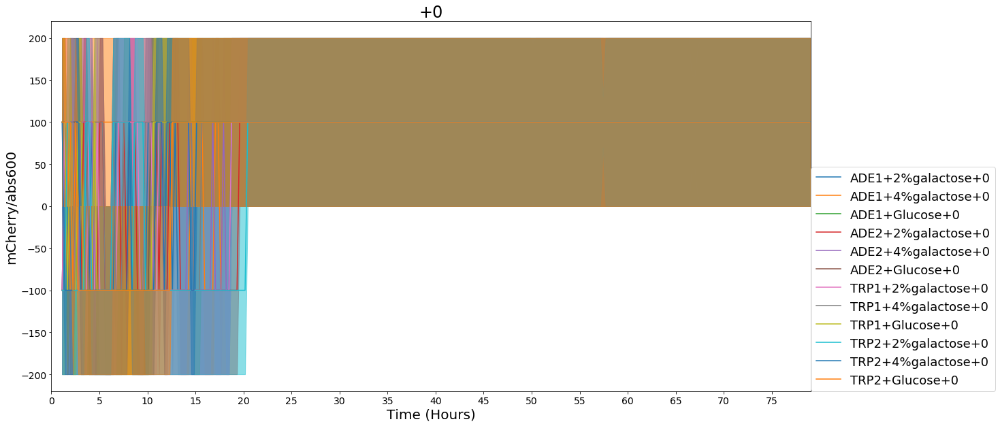

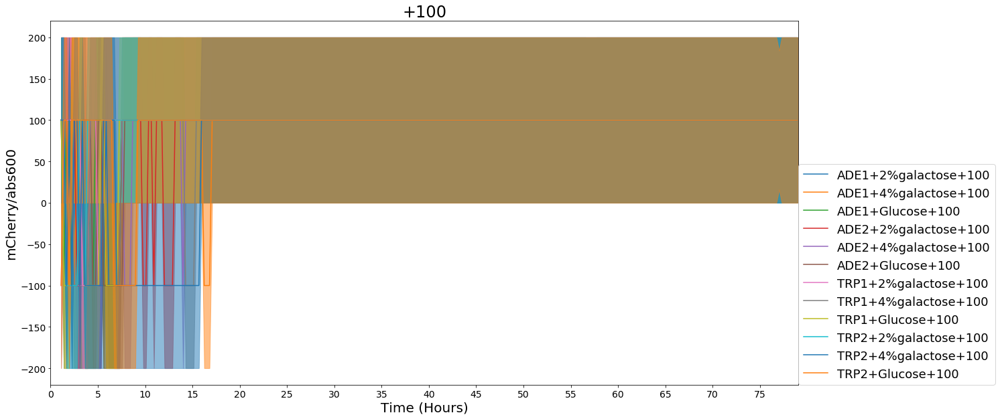

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


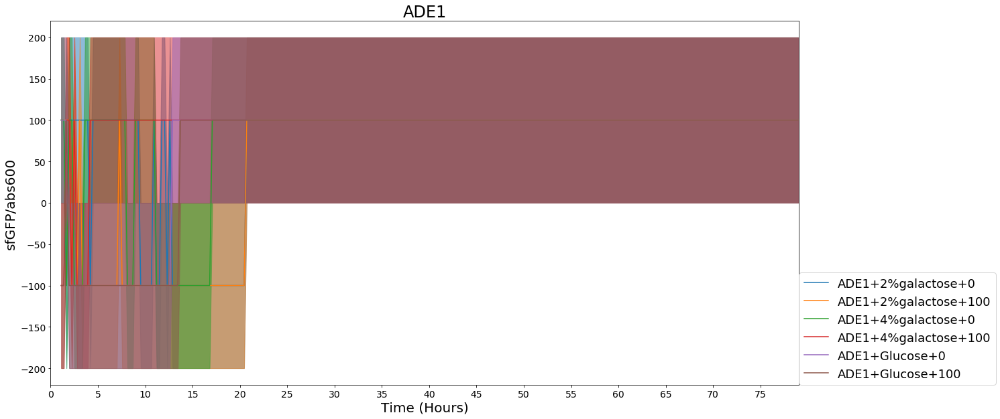

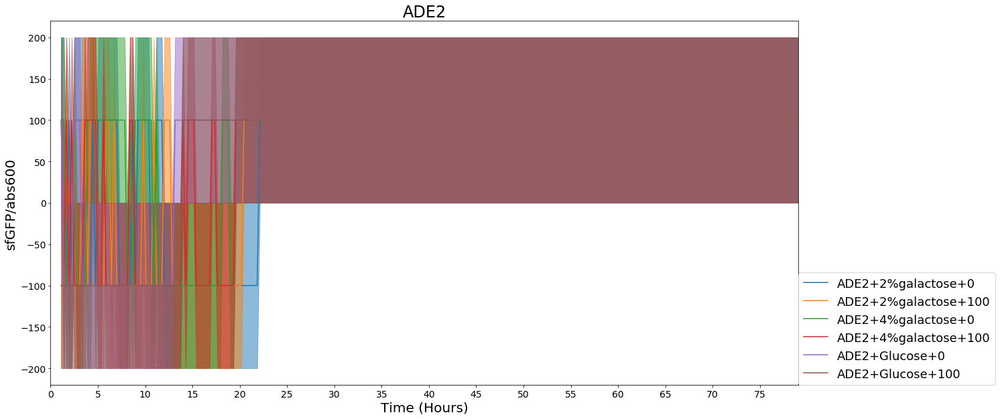

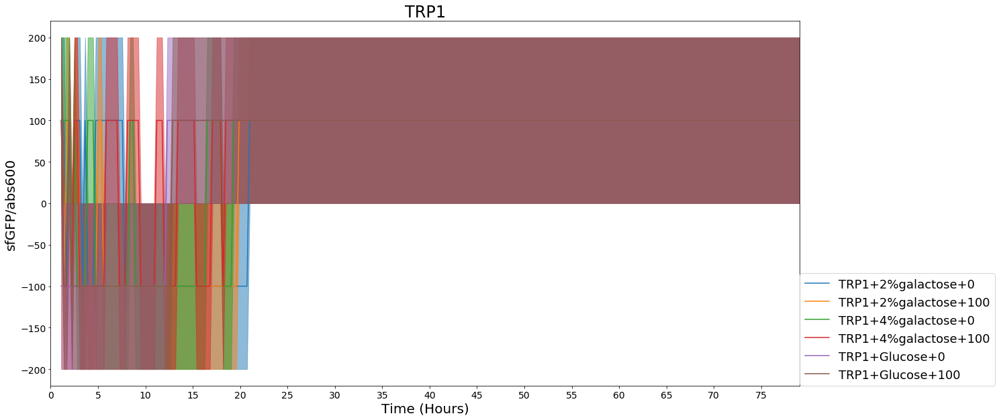

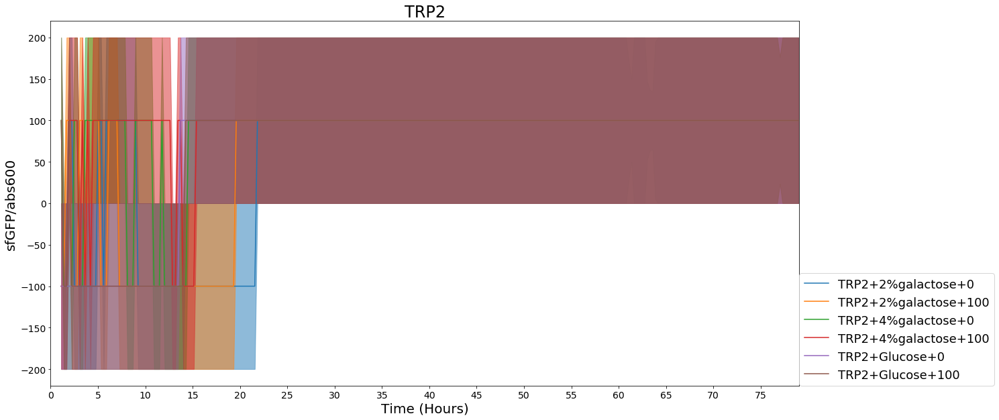

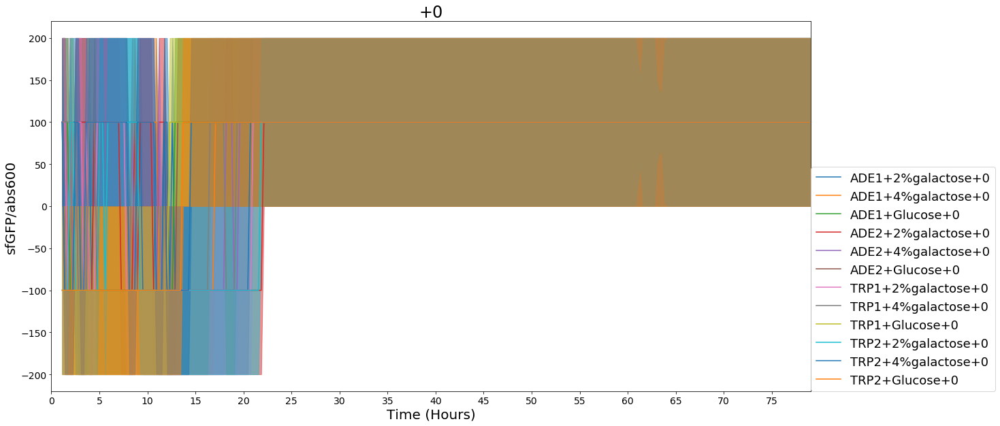

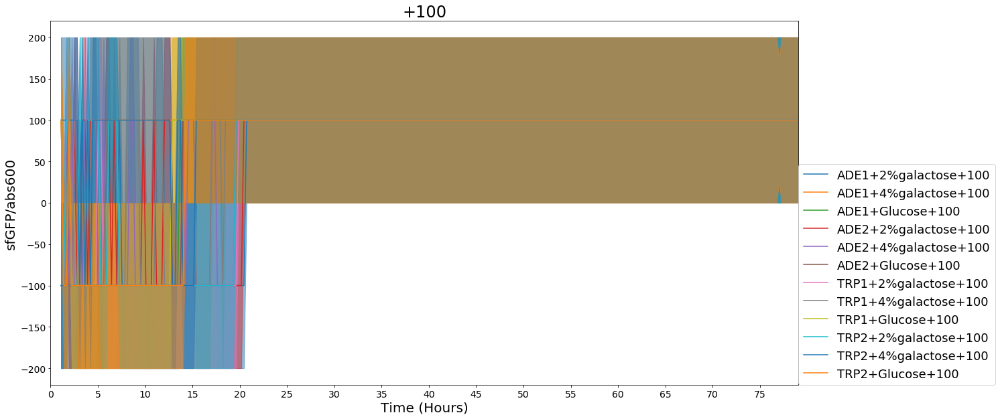

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


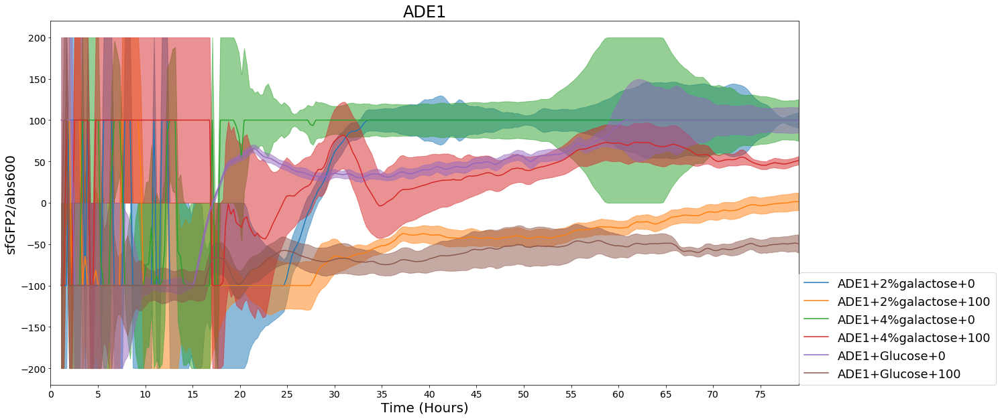

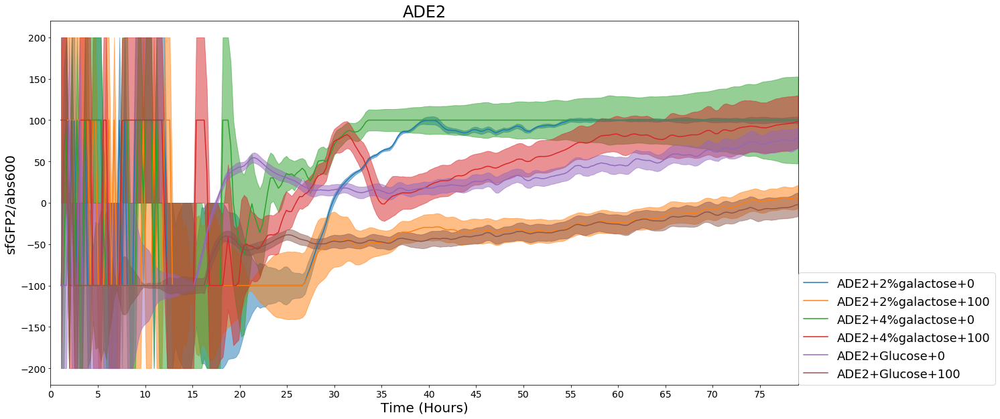

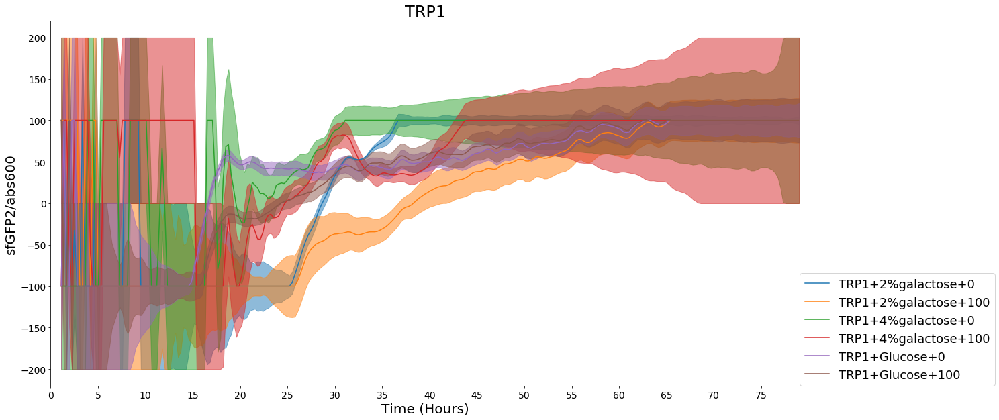

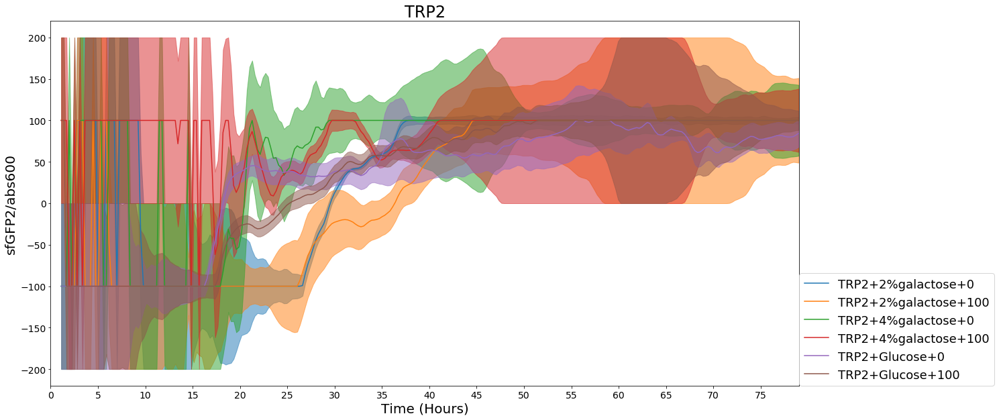

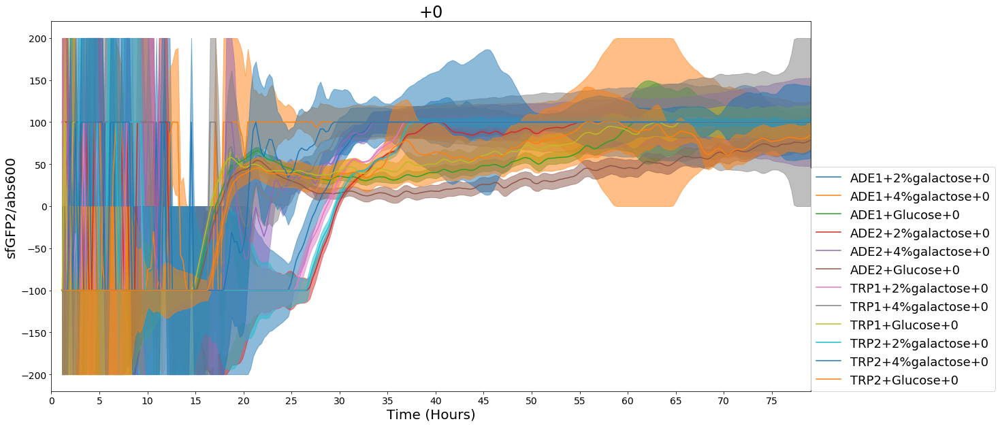

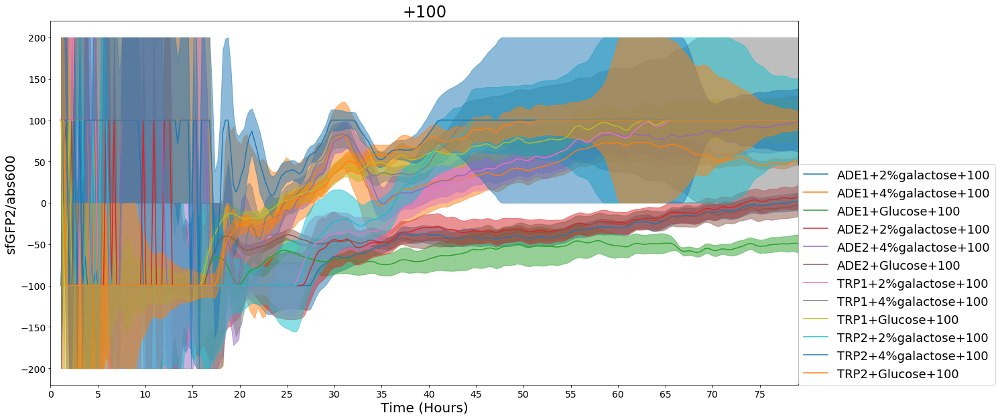

In [18]:
# figure outr what;s going on with means

for measure in ['mCherry', 'sfGFP', 'sfGFP2']:
    ratio = smoothed.ratio_time_course(measure,'abs600')
    means = ratio.mean_by_name(ps)
    sems = ratio.sem_by_name(ps)
    cap = 100
    mean_OD = means.data_for_label(measure+'/abs600')
    sems_OD = sems.data_for_label(measure+'/abs600')
    
    time_h = mean_OD.time_s / (60.0*60.0)
    
    mean_OD[mean_OD>cap]=cap
    mean_OD[mean_OD<-cap]=-cap
    
    sems_OD[sems_OD>cap]=cap
    sems_OD[sems_OD<-cap]=-cap

    # groupings of samples for plotting
    samples = ['ADE1','ADE2','TRP1','TRP2']

    for sample in samples:
        plt.figure(figsize=(20,10))

        colors = seaborn.color_palette()
        for i, c in enumerate([c for c in mean_OD.columns if (c.startswith(sample))]):
            label = c
            color = colors[i % len(colors)]
            plt.fill_between(time_h, mean_OD[c] - sems_OD[c], mean_OD[c] + sems_OD[c],
                             color=color, alpha=0.5)
            plt.plot(time_h, mean_OD[c], label=label, color=color)


        plt.legend(loc=(1,0), fontsize=18)
        plt.xlim(0, np.max(time_h)+.1)
    #     plt.ylim(-0.1, 1.3)
        plt.xticks(np.arange(0, np.max(time_h)+.1, 5), fontsize=14)
        plt.yticks(fontsize=14)
        plt.title(sample, fontsize=24)
        plt.xlabel('Time (Hours)', fontsize=20)
        plt.ylabel(measure+'/abs600', fontsize=20)

    plt.show()

    # groupings of samples for plotting
    samples = ['+0','+100']

    for sample in samples:
        plt.figure(figsize=(20,10))

        colors = seaborn.color_palette()
        for i, c in enumerate([c for c in mean_OD.columns if (c.endswith(sample))]):
            label = c
            color = colors[i % len(colors)]
            plt.fill_between(time_h, mean_OD[c] - sems_OD[c], mean_OD[c] + sems_OD[c],
                             color=color, alpha=0.5)
            plt.plot(time_h, mean_OD[c], label=label, color=color)


        plt.legend(loc=(1,0), fontsize=18)
        plt.xlim(0, np.max(time_h)+.1)
    #     plt.ylim(-0.1, 1.3)
        plt.xticks(np.arange(0, np.max(time_h)+.1, 5), fontsize=14)
        plt.yticks(fontsize=14)
        plt.title(sample, fontsize=24)
        plt.xlabel('Time (Hours)', fontsize=20)
        plt.ylabel(measure+'/abs600', fontsize=20)

    plt.show()